# https://pytorch.org/audio/stable/tutorials/forced_alignment_tutorial.html

In [2]:
!pip install soundfile
!pip install torchaudio
!pip install torch
!pip install inflect

You should consider upgrading via the 'C:\Users\Artem Shkabruk\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\Users\Artem Shkabruk\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\Users\Artem Shkabruk\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


  Using cached inflect-7.4.0-py3-none-any.whl (34 kB)
  Using cached more_itertools-10.5.0-py3-none-any.whl (60 kB)
  Using cached typeguard-4.4.1-py3-none-any.whl (35 kB)


You should consider upgrading via the 'C:\Users\Artem Shkabruk\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


In [3]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)


device = torch.device(torch.cuda.set_device(0) if torch.cuda.is_available() else "cpu")
print(device)

2.5.1+cpu
2.5.1+cpu
cpu


In [4]:
import inflect
import re

p = inflect.engine()

# Function to replace numbers with their written transcript
def replace_numbers_with_words(text):
    # Find all numbers in the text
    numbers = re.findall(r"\d+", text)
    for number in numbers:
        # Convert number to words
        number_in_words = p.number_to_words(number)
        # Replace number with words in the text
        text = text.replace(number, number_in_words)
    return text

In [5]:
from dataclasses import dataclass

import IPython
import matplotlib.pyplot as plt

torch.random.manual_seed(0)

SPEECH_FILE = "data/1min_sample.wav"

In [6]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H
model = bundle.get_model().to(device)
labels = bundle.get_labels()
with torch.inference_mode():
    waveform, _ = torchaudio.load(SPEECH_FILE)
    emissions, _ = model(waveform.to(device))
    emissions = torch.log_softmax(emissions, dim=-1)

emission = emissions[0].cpu().detach()

print(labels)

('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


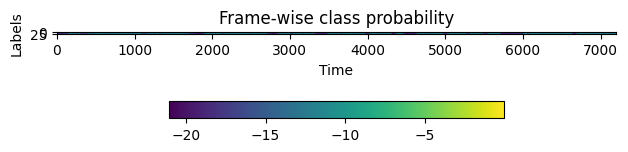

In [7]:
def plot():
    fig, ax = plt.subplots()
    img = ax.imshow(emission.T)
    ax.set_title("Frame-wise class probability")
    ax.set_xlabel("Time")
    ax.set_ylabel("Labels")
    fig.colorbar(img, ax=ax, shrink=0.6, location="bottom")
    fig.tight_layout()


plot()

In [8]:
text = open("data/1min_sample.txt", encoding="utf-8").read().replace("\n", " ").replace(".", "").replace(",", "")

# Replace non-latin-1 characters with a space
text = str(text.encode("latin-1", errors="replace").decode("latin-1").encode("latin-1"))[2:]

print(text)

Good afternoon My colleagues and I remain squarely focused on achieving our dual-mandate goals of maximum employment and stable prices for the benefit of the American people Our economy is strong overall and has made significant progress toward our goals over the past two years The labor market has cooled from its formerly overheated state Inflation has eased substantially from a peak of 7?percent to an estimated 22?percent as of August We?re committed to maintaining our economy?s strength by supporting maximum employment and returning inflation to our 2?percent goal Today the Federal Open Market Committee decided to reduce the degree of policy restraint by lowering our policy interest rate by \xbd percentage point'


In [9]:
text = text.replace("?", " ").replace("\\", "").replace(" ", "|") # fix this afterward after asking martin
print(text)

Good|afternoon|My|colleagues|and|I|remain|squarely|focused|on|achieving|our|dual-mandate|goals|of|maximum|employment|and|stable|prices|for|the|benefit|of|the|American|people|Our|economy|is|strong|overall|and|has|made|significant|progress|toward|our|goals|over|the|past|two|years|The|labor|market|has|cooled|from|its|formerly|overheated|state|Inflation|has|eased|substantially|from|a|peak|of|7|percent|to|an|estimated|22|percent|as|of|August|We|re|committed|to|maintaining|our|economy|s|strength|by|supporting|maximum|employment|and|returning|inflation|to|our|2|percent|goal|Today|the|Federal|Open|Market|Committee|decided|to|reduce|the|degree|of|policy|restraint|by|lowering|our|policy|interest|rate|by|xbd|percentage|point'


In [10]:
# We enclose the transcript with space tokens, which represent SOS and EOS.
transcript = replace_numbers_with_words(text).upper()

dictionary = {c: i for i, c in enumerate(labels)}
tokens = [dictionary[c] for c in transcript]
print(list(zip(transcript, tokens)))


def get_trellis(emission, tokens, blank_id=0):
    num_frame = emission.size(0)
    num_tokens = len(tokens)

    trellis = torch.zeros((num_frame, num_tokens))
    trellis[1:, 0] = torch.cumsum(emission[1:, blank_id], 0)
    trellis[0, 1:] = -float("inf")
    trellis[-num_tokens + 1 :, 0] = float("inf")

    for t in range(num_frame - 1):
        trellis[t + 1, 1:] = torch.maximum(
            # Score for staying at the same token
            trellis[t, 1:] + emission[t, blank_id],
            # Score for changing to the next token
            trellis[t, :-1] + emission[t, tokens[1:]],
        )
    return trellis


trellis = get_trellis(emission, tokens)

[('G', 18), ('O', 5), ('O', 5), ('D', 11), ('|', 1), ('A', 4), ('F', 17), ('T', 3), ('E', 2), ('R', 10), ('N', 6), ('O', 5), ('O', 5), ('N', 6), ('|', 1), ('M', 14), ('Y', 19), ('|', 1), ('C', 16), ('O', 5), ('L', 12), ('L', 12), ('E', 2), ('A', 4), ('G', 18), ('U', 13), ('E', 2), ('S', 9), ('|', 1), ('A', 4), ('N', 6), ('D', 11), ('|', 1), ('I', 7), ('|', 1), ('R', 10), ('E', 2), ('M', 14), ('A', 4), ('I', 7), ('N', 6), ('|', 1), ('S', 9), ('Q', 27), ('U', 13), ('A', 4), ('R', 10), ('E', 2), ('L', 12), ('Y', 19), ('|', 1), ('F', 17), ('O', 5), ('C', 16), ('U', 13), ('S', 9), ('E', 2), ('D', 11), ('|', 1), ('O', 5), ('N', 6), ('|', 1), ('A', 4), ('C', 16), ('H', 8), ('I', 7), ('E', 2), ('V', 22), ('I', 7), ('N', 6), ('G', 18), ('|', 1), ('O', 5), ('U', 13), ('R', 10), ('|', 1), ('D', 11), ('U', 13), ('A', 4), ('L', 12), ('-', 0), ('M', 14), ('A', 4), ('N', 6), ('D', 11), ('A', 4), ('T', 3), ('E', 2), ('|', 1), ('G', 18), ('O', 5), ('A', 4), ('L', 12), ('S', 9), ('|', 1), ('O', 5), ('F'

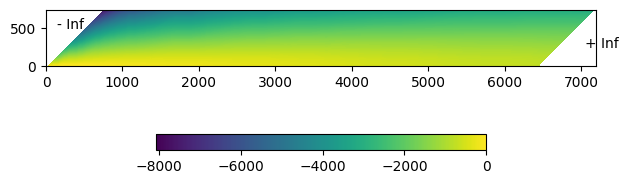

In [11]:
def plot():
    fig, ax = plt.subplots()
    img = ax.imshow(trellis.T, origin="lower")
    ax.annotate("- Inf", (trellis.size(1) / 5, trellis.size(1) / 1.5))
    ax.annotate("+ Inf", (trellis.size(0) - trellis.size(1) / 5, trellis.size(1) / 3))
    fig.colorbar(img, ax=ax, shrink=0.6, location="bottom")
    fig.tight_layout()


plot()

In [12]:
@dataclass
class Point:
    token_index: int
    time_index: int
    score: float


def backtrack(trellis, emission, tokens, blank_id=0):
    t, j = trellis.size(0) - 1, trellis.size(1) - 1

    path = [Point(j, t, emission[t, blank_id].exp().item())]
    while j > 0:
        # Should not happen but just in case
        assert t > 0

        # 1. Figure out if the current position was stay or change
        # Frame-wise score of stay vs change
        p_stay = emission[t - 1, blank_id]
        p_change = emission[t - 1, tokens[j]]

        # Context-aware score for stay vs change
        stayed = trellis[t - 1, j] + p_stay
        changed = trellis[t - 1, j - 1] + p_change

        # Update position
        t -= 1
        if changed > stayed:
            j -= 1

        # Store the path with frame-wise probability.
        prob = (p_change if changed > stayed else p_stay).exp().item()
        path.append(Point(j, t, prob))

    # Now j == 0, which means, it reached the SoS.
    # Fill up the rest for the sake of visualization
    while t > 0:
        prob = emission[t - 1, blank_id].exp().item()
        path.append(Point(j, t - 1, prob))
        t -= 1

    return path[::-1]


path = backtrack(trellis, emission, tokens)
for p in path:
    print(p)

Point(token_index=0, time_index=0, score=0.9999853372573853)
Point(token_index=0, time_index=1, score=0.9999874830245972)
Point(token_index=0, time_index=2, score=0.9999892711639404)
Point(token_index=0, time_index=3, score=0.9999880790710449)
Point(token_index=0, time_index=4, score=0.9999901056289673)
Point(token_index=0, time_index=5, score=0.9999911785125732)
Point(token_index=0, time_index=6, score=0.9999945163726807)
Point(token_index=0, time_index=7, score=0.9999940395355225)
Point(token_index=0, time_index=8, score=0.9999922513961792)
Point(token_index=0, time_index=9, score=0.9999948740005493)
Point(token_index=0, time_index=10, score=0.999995231628418)
Point(token_index=0, time_index=11, score=0.9999940395355225)
Point(token_index=0, time_index=12, score=0.9999943971633911)
Point(token_index=0, time_index=13, score=0.999994158744812)
Point(token_index=0, time_index=14, score=0.999879002571106)
Point(token_index=0, time_index=15, score=0.9999943971633911)
Point(token_index=0, 

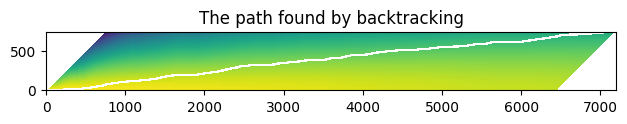

In [13]:
def plot_trellis_with_path(trellis, path):
    # To plot trellis with path, we take advantage of 'nan' value
    trellis_with_path = trellis.clone()
    for _, p in enumerate(path):
        trellis_with_path[p.time_index, p.token_index] = float("nan")
    plt.imshow(trellis_with_path.T, origin="lower")
    plt.title("The path found by backtracking")
    plt.tight_layout()


plot_trellis_with_path(trellis, path)

In [14]:
# Merge the labels
@dataclass
class Segment:
    label: str
    start: int
    end: int
    score: float

    def __repr__(self):
        return f"{self.label}\t({self.score:4.2f}): [{self.start:5d}, {self.end:5d})"

    @property
    def length(self):
        return self.end - self.start


def merge_repeats(path):
    i1, i2 = 0, 0
    segments = []
    while i1 < len(path):
        while i2 < len(path) and path[i1].token_index == path[i2].token_index:
            i2 += 1
        score = sum(path[k].score for k in range(i1, i2)) / (i2 - i1)
        segments.append(
            Segment(
                transcript[path[i1].token_index],
                path[i1].time_index,
                path[i2 - 1].time_index + 1,
                score,
            )
        )
        i1 = i2
    return segments


segments = merge_repeats(path)
for seg in segments:
    print(seg)

G	(0.98): [    0,   182)
O	(0.43): [  182,   183)
O	(0.78): [  183,   189)
D	(0.82): [  189,   190)
|	(0.92): [  190,   226)
A	(0.76): [  226,   232)
F	(0.93): [  232,   273)
T	(0.70): [  273,   277)
E	(0.89): [  277,   286)
R	(0.02): [  286,   287)
N	(0.97): [  287,   411)
O	(0.66): [  411,   413)
O	(0.02): [  413,   414)
N	(0.01): [  414,   415)
|	(0.04): [  415,   416)
M	(0.84): [  416,   428)
Y	(0.59): [  428,   430)
|	(0.97): [  430,   470)
C	(0.48): [  470,   472)
O	(0.83): [  472,   478)
L	(0.12): [  478,   479)
L	(0.79): [  479,   484)
E	(0.89): [  484,   502)
A	(0.89): [  502,   517)
G	(0.85): [  517,   535)
U	(0.49): [  535,   537)
E	(0.90): [  537,   553)
S	(0.39): [  553,   556)
|	(0.87): [  556,   561)
A	(0.16): [  561,   563)
N	(0.65): [  563,   566)
D	(0.36): [  566,   567)
|	(0.00): [  567,   568)
I	(0.14): [  568,   569)
|	(0.49): [  569,   571)
R	(0.64): [  571,   574)
E	(0.87): [  574,   584)
M	(0.95): [  584,   600)
A	(0.84): [  600,   625)
I	(0.01): [  625,   626)


In [15]:
def plot_trellis_with_segments(trellis, segments, transcript):
    # To plot trellis with path, we take advantage of 'nan' value
    trellis_with_path = trellis.clone()
    for i, seg in enumerate(segments):
        if seg.label != "|":
            trellis_with_path[seg.start : seg.end, i] = float("nan")

    fig, [ax1, ax2] = plt.subplots(2, 1, sharex=True)
    ax1.set_title("Path, label and probability for each label")
    ax1.imshow(trellis_with_path.T, origin="lower", aspect="auto")

    for i, seg in enumerate(segments):
        if seg.label != "|":
            ax1.annotate(seg.label, (seg.start, i - 0.7), size="small")
            ax1.annotate(f"{seg.score:.2f}", (seg.start, i + 3), size="small")

    ax2.set_title("Label probability with and without repetation")
    xs, hs, ws = [], [], []
    for seg in segments:
        if seg.label != "|":
            xs.append((seg.end + seg.start) / 2 + 0.4)
            hs.append(seg.score)
            ws.append(seg.end - seg.start)
            ax2.annotate(seg.label, (seg.start + 0.8, -0.07))
    ax2.bar(xs, hs, width=ws, color="gray", alpha=0.5, edgecolor="black")

    xs, hs = [], []
    for p in path:
        label = transcript[p.token_index]
        if label != "|":
            xs.append(p.time_index + 1)
            hs.append(p.score)

    ax2.bar(xs, hs, width=0.5, alpha=0.5)
    ax2.axhline(0, color="black")
    ax2.grid(True, axis="y")
    ax2.set_ylim(-0.1, 1.1)
    fig.tight_layout()

In [16]:
# Merge words
def merge_words(segments, separator="|"):
    words = []
    i1, i2 = 0, 0
    while i1 < len(segments):
        if i2 >= len(segments) or segments[i2].label == separator:
            if i1 != i2:
                segs = segments[i1:i2]
                word = "".join([seg.label for seg in segs])
                score = sum(seg.score * seg.length for seg in segs) / sum(seg.length for seg in segs)
                words.append(Segment(word, segments[i1].start, segments[i2 - 1].end, score))
            i1 = i2 + 1
            i2 = i1
        else:
            i2 += 1
    return words


word_segments = merge_words(segments)
for word in word_segments:
    print(word)

GOOD	(0.97): [    0,   190)
AFTERNOON	(0.92): [  226,   415)
MY	(0.80): [  416,   430)
COLLEAGUES	(0.83): [  470,   556)
AND	(0.44): [  561,   567)
I	(0.14): [  568,   569)
REMAIN	(0.85): [  571,   630)
SQUARELY	(0.62): [  634,   654)
FOCUSED	(0.80): [  687,   724)
ON	(0.61): [  733,   737)
ACHIEVING	(0.72): [  738,   766)
OUR	(0.53): [  781,   786)
DUAL-MANDATE	(0.86): [  787,   890)
GOALS	(0.80): [  893,   914)
OF	(0.79): [  933,   942)
MAXIMUM	(0.86): [  965,  1014)
EMPLOYMENT	(0.79): [ 1015,  1080)
AND	(0.71): [ 1173,  1181)
STABLE	(0.68): [ 1221,  1244)
PRICES	(0.83): [ 1272,  1317)
FOR	(0.71): [ 1347,  1356)
THE	(0.86): [ 1371,  1391)
BENEFIT	(0.74): [ 1398,  1425)
OF	(0.70): [ 1435,  1442)
THE	(0.32): [ 1446,  1449)
AMERICAN	(0.78): [ 1459,  1502)
PEOPLE	(0.84): [ 1506,  1548)
OUR	(0.65): [ 1568,  1575)
ECONOMY	(0.84): [ 1581,  1626)
IS	(0.66): [ 1670,  1676)
STRONG	(0.73): [ 1906,  1928)
OVERALL	(0.82): [ 1942,  1983)
AND	(0.50): [ 1985,  1990)
HAS	(0.86): [ 2000,  2026)
MADE	(

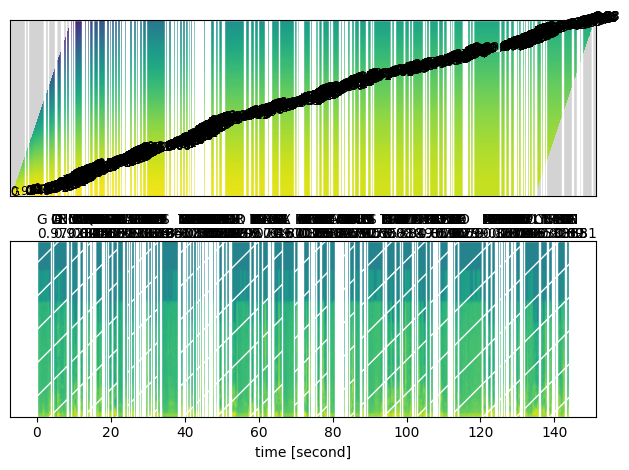

In [17]:
def plot_alignments(trellis, segments, word_segments, waveform, sample_rate=bundle.sample_rate):
    trellis_with_path = trellis.clone()
    for i, seg in enumerate(segments):
        if seg.label != "|":
            trellis_with_path[seg.start : seg.end, i] = float("nan")

    fig, [ax1, ax2] = plt.subplots(2, 1)

    ax1.imshow(trellis_with_path.T, origin="lower", aspect="auto")
    ax1.set_facecolor("lightgray")
    ax1.set_xticks([])
    ax1.set_yticks([])

    for word in word_segments:
        ax1.axvspan(word.start - 0.5, word.end - 0.5, edgecolor="white", facecolor="none")

    for i, seg in enumerate(segments):
        if seg.label != "|":
            ax1.annotate(seg.label, (seg.start, i - 0.7), size="small")
            ax1.annotate(f"{seg.score:.2f}", (seg.start, i + 3), size="small")

    # The original waveform
    ratio = waveform.size(0) / sample_rate / trellis.size(0)
    ax2.specgram(waveform, Fs=sample_rate)
    for word in word_segments:
        x0 = ratio * word.start
        x1 = ratio * word.end
        ax2.axvspan(x0, x1, facecolor="none", edgecolor="white", hatch="/")
        ax2.annotate(f"{word.score:.2f}", (x0, sample_rate * 0.51), annotation_clip=False)

    for seg in segments:
        if seg.label != "|":
            ax2.annotate(seg.label, (seg.start * ratio, sample_rate * 0.55), annotation_clip=False)
    ax2.set_xlabel("time [second]")
    ax2.set_yticks([])
    fig.tight_layout()


plot_alignments(
    trellis,
    segments,
    word_segments,
    waveform[0],
)

In [57]:
def display_segment(i):
    ratio = waveform.size(1) / trellis.size(0)
    word = word_segments[i]
    x0 = int(ratio * word.start)
    x1 = int(ratio * word.end) #originally word.end
    print(f"{word.label} ({word.score:.2f}): {x0 / bundle.sample_rate:.3f} - {x1 / bundle.sample_rate:.3f} sec")
    segment = waveform[:, x0:x1]
    return IPython.display.Audio(segment.squeeze().numpy(), rate=bundle.sample_rate*3) # originally bundle.sample_rate without the multiplier

In [39]:
# Generate the audio for each segment
print(transcript)
IPython.display.Audio(SPEECH_FILE)

GOOD|AFTERNOON|MY|COLLEAGUES|AND|I|REMAIN|SQUARELY|FOCUSED|ON|ACHIEVING|OUR|DUAL-MANDATE|GOALS|OF|MAXIMUM|EMPLOYMENT|AND|STABLE|PRICES|FOR|THE|BENEFIT|OF|THE|AMERICAN|PEOPLE|OUR|ECONOMY|IS|STRONG|OVERALL|AND|HAS|MADE|SIGNIFICANT|PROGRESS|TOWARD|OUR|GOALS|OVER|THE|PAST|TWO|YEARS|THE|LABOR|MARKET|HAS|COOLED|FROM|ITS|FORMERLY|OVERHEATED|STATE|INFLATION|HAS|EASED|SUBSTANTIALLY|FROM|A|PEAK|OF|SEVEN|PERCENT|TO|AN|ESTIMATED|TWENTY-TWO|PERCENT|AS|OF|AUGUST|WE|RE|COMMITTED|TO|MAINTAINING|OUR|ECONOMY|S|STRENGTH|BY|SUPPORTING|MAXIMUM|EMPLOYMENT|AND|RETURNING|INFLATION|TO|OUR|TWO|PERCENT|GOAL|TODAY|THE|FEDERAL|OPEN|MARKET|COMMITTEE|DECIDED|TO|REDUCE|THE|DEGREE|OF|POLICY|RESTRAINT|BY|LOWERING|OUR|POLICY|INTEREST|RATE|BY|XBD|PERCENTAGE|POINT'


In [68]:
display_segment(0) # Good

GOOD (0.97): 0.000 - 3.800 sec


# Questions

- Ideal length of .wav files? ask for chunking. And ideal length of .wav for fine-tuning? forced alignment is just here for automating audio transcription. (apparently ~7 seconds wav length)
- How much wav data is needed for good results in fine-tuning?
- preprocessing of numbers, common words - could i just emit them? Just generally emit all sentences that do not contain any financial topics? But this will be fine-tuned on the speaker, so maybe keep it?
- encoding transcription with utf-8 and then decode with latin-1
- compare to what baseline and other models?


### the main idea of forced alignment is the automization of chunking longer audio into smaller ones (appr. 7 seconds) and extract only chunks containing financial terms